# Import packages and data

In [2]:
%load_ext autoreload
%autoreload 2

In [33]:
import numpy as np
from matplotlib import pyplot as plt
from functools import partial
from scipy.optimize import fmin
import torch
import os, glob
import plotly.express as px
import matplotlib.animation as animation
from IPython.display import HTML, Video, display

from indentation.indentationset import IndentationSet
from indentation.processing.find_contact import findContact_minimum, findContact_blackMagic, findContact_blackMagic_CNN
from indentation.processing.signal import do_nothing, crop_afm_temp, crop_start, crop_end
from indentation.processing.calculate_parameters import parameter_youngs_modulus, parameter_defelection_sensitivity
from indentation.processing.plotting import plot_curve_parameters_bar, plot_instance_parameters_bar, plot_mean_force_curves
from indentation.ml.models import ConvClassifier_1, ConvClassifier_2

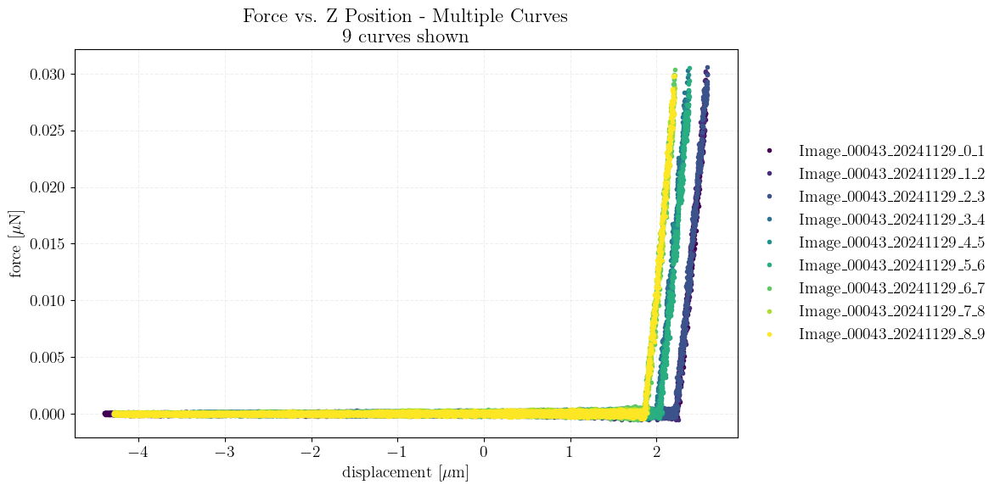

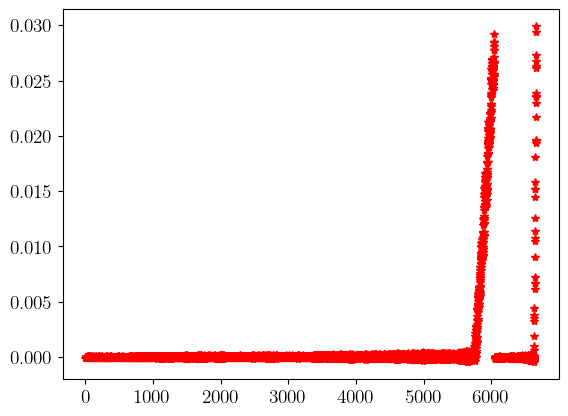

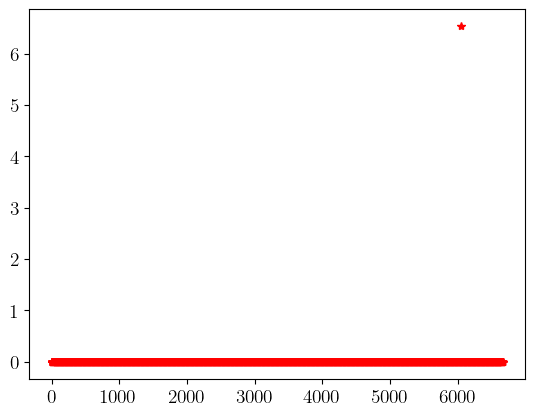

6226


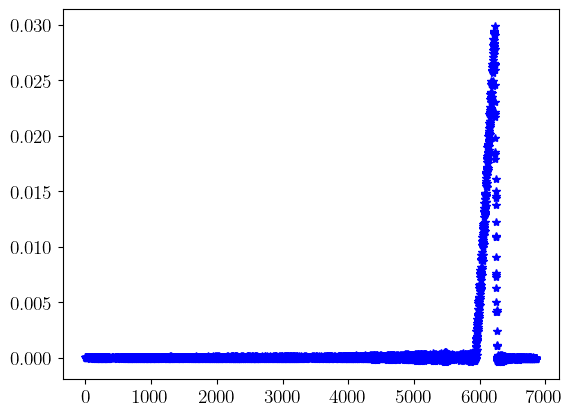

In [53]:
paths = glob.glob(r"E:\Group\File_Exchange\Raoul_Paula\2024_11_29\afm_pdms35t1_plasma_pbs_no3\*.txt")

afm = IndentationSet(paths, exp_type="afm")

%matplotlib inline

afm.plot_all(linestyle="")

f = afm.data[4]["raw"]["force"]

plt.figure()
plt.plot(afm.data[4]["raw"]["force"], 'r*')
plt.show()


plt.figure()
plt.plot(np.diff(afm.data[4]["raw"]["z"]), 'r*')
plt.show()

z = afm.data[0]["raw"]["z"] 
ix = np.argmax(np.diff(z))
print(ix)

f = afm.data[0]["raw"]["force"] 

f[ix:] = f[ix:][::-1]

plt.figure()
plt.plot(f[:-1], 'b*')
plt.show()

# Processing data

In [57]:

## Animation

# Use this to enable interactive plotting inside the notebook
%matplotlib notebook
# vs. notebook

# Parameters (User can modify these)
L = 125              # Length of the beam (m)

# Distance along the length of the beam
x = np.linspace(0, L, 1000)


# Create a custom deflection signal (input data)
# User can replace this with their own deflection data (deflection at the end)
f = afm.data[0]["raw"]["force"] 
z = afm.data[0]["raw"]["z"] 
ix = np.argmax(np.diff(z))
f[ix:] = f[ix:][::-1]
deflection_at_end_signal = f[:-2] / 0.1  # Example: end deflection increases over time

plt.figure()
plt.plot(deflection_at_end_signal, 'b*')
plt.show()

# Resample the deflection signal to a more suitable frame rate
target_frames = 300  # Choose the number of frames to display
resampled_deflection_signal = np.linspace(0, len(deflection_at_end_signal) - 1, target_frames).astype(int)
downsampled_deflection_signal = deflection_at_end_signal[resampled_deflection_signal]

# Create figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Initial beam (straight line)
line_beam, = ax.plot([0, L], [0, 0], color="black", linewidth=5)  # Beam as a line
line_deflection, = ax.plot([], [], color="blue", linewidth=3, label="Deflected Beam")  # Deflected beam

# Setup plot limits
ax.set_xlim(0, L)
ax.set_ylim(-0.1, 0.5)
ax.set_title('Cantilever Beam Deflection Animation')
ax.set_xlabel('Distance from Fixed End (m)')
ax.set_ylabel('Deflection (m)')
ax.axhline(0, color='black', linewidth=0.5)  # x-axis
ax.axvline(0, color='black', linewidth=0.5)  # y-axis
ax.legend()

# Animation function
def animate(i):
    # Get the deflection at the end of the beam (this will change with time)
    deflection_at_end = downsampled_deflection_signal[i]
    
    # Interpolate the deflection profile between the fixed end (0) and the free end (L)
    deflection_at_i = (deflection_at_end) * (x**3) / (L**3)  # Simplified interpolation
    
    # Update the deflection plot
    line_deflection.set_data(x, deflection_at_i)
    
    return line_deflection

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=target_frames, interval=50, repeat=False)

# Display the animation in Jupyter Lab using HTML5 video
#HTML(ani.to_html5_video())  # This uses HTML5 video for proper display in Jupyter Lab

# Save the animation as an HTML5 video file (this step is important for displaying in Jupyter Lab)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

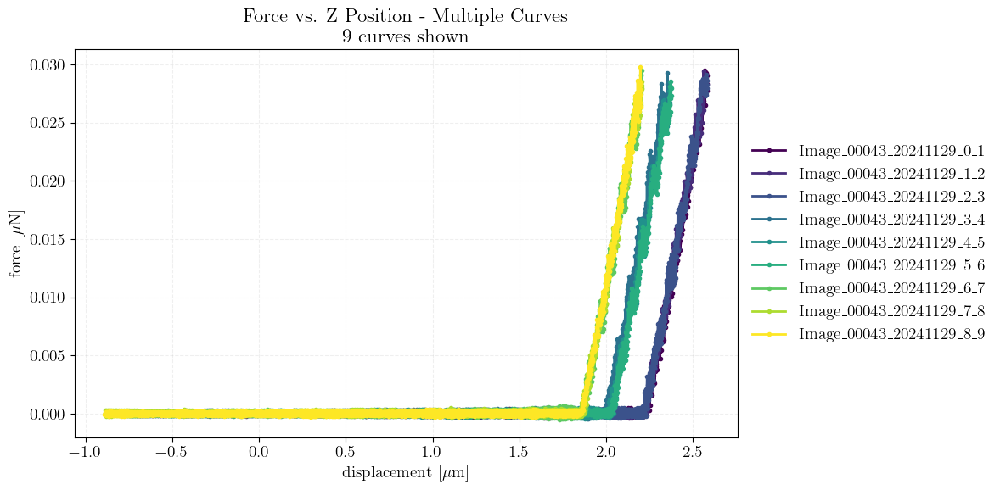

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Force vs. Z Position - Multiple Curves\n9 curves shown'}, xlabel='displacement [$\\mu$m]', ylabel='force [$\\mu$N]'>)

In [30]:
processing_pl = [crop_afm_temp]

afm.process_raw(processing_pl)
afm.plot_all(linestyle="-")

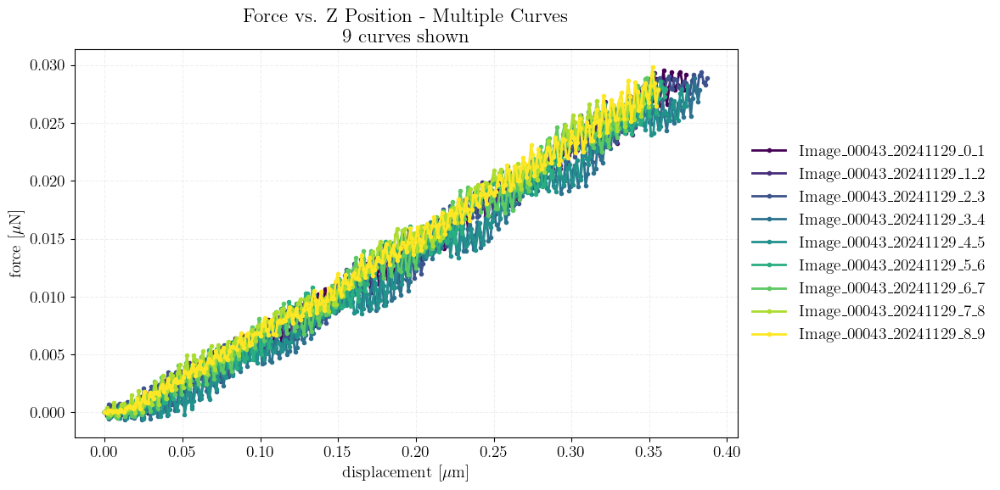

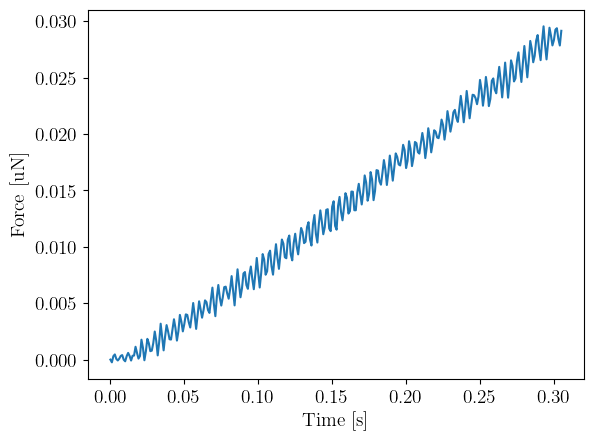

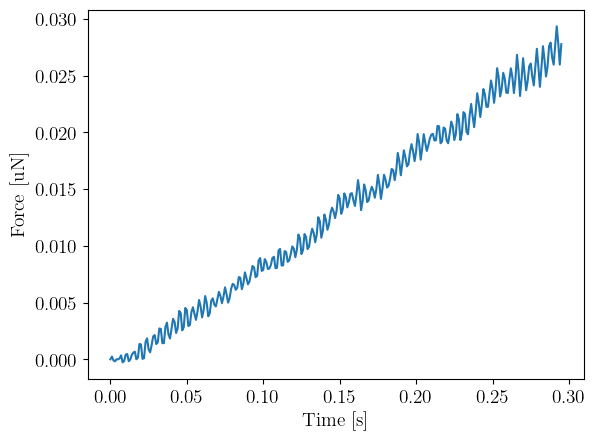

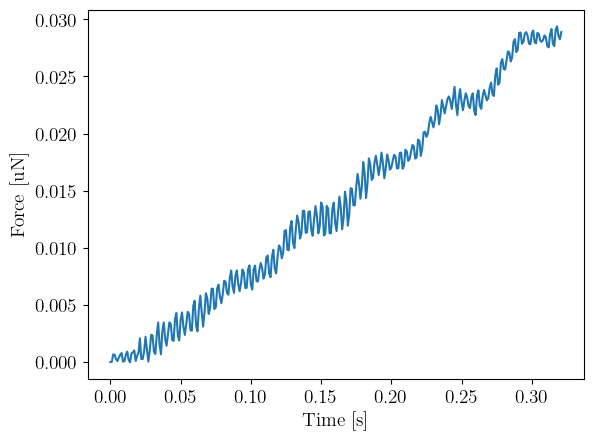

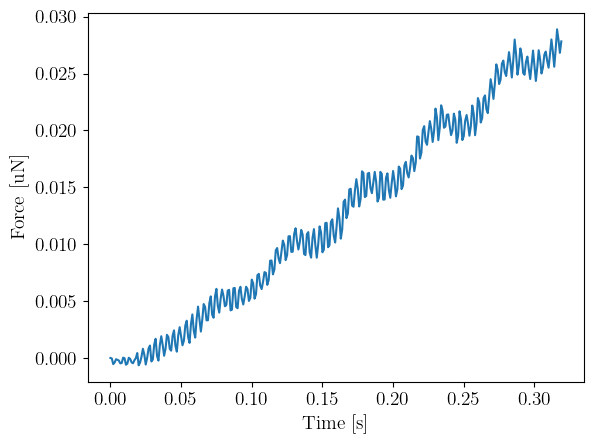

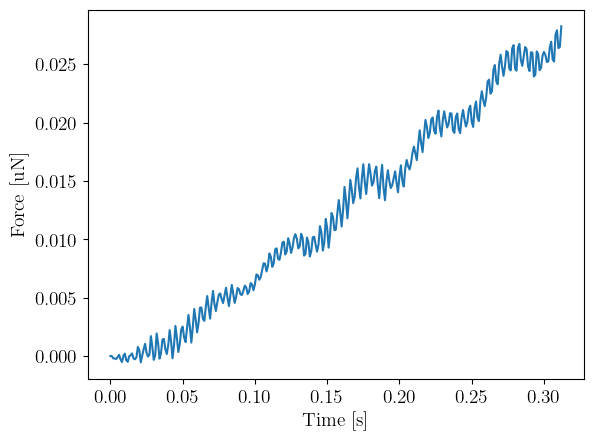

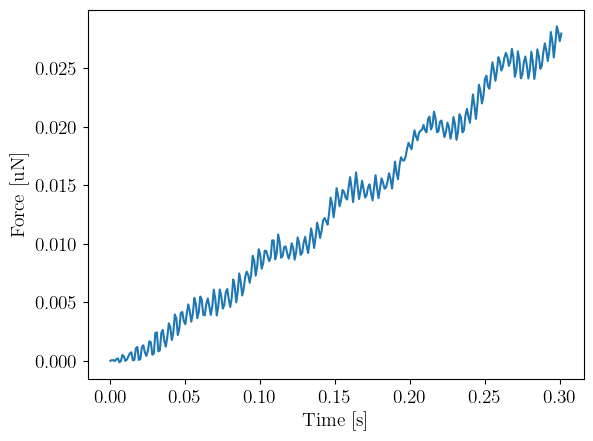

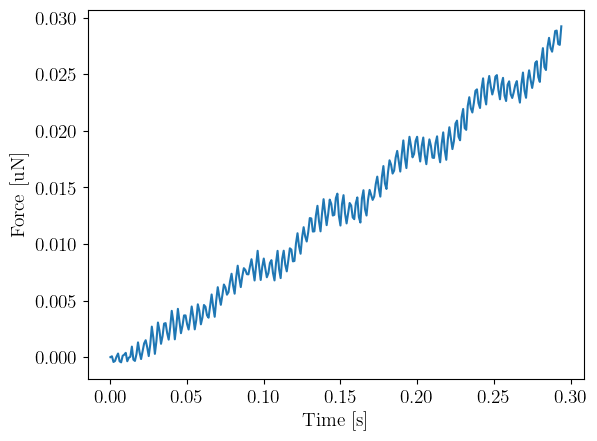

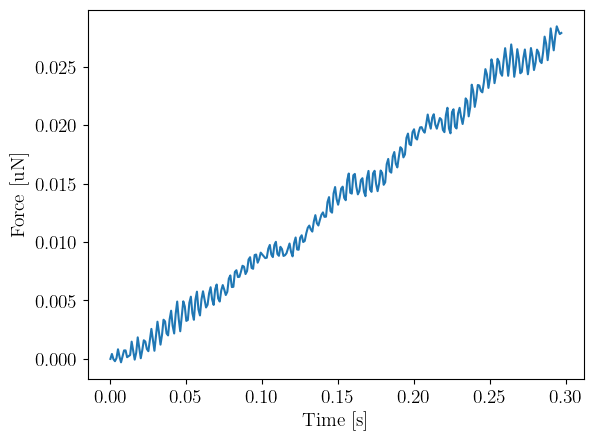

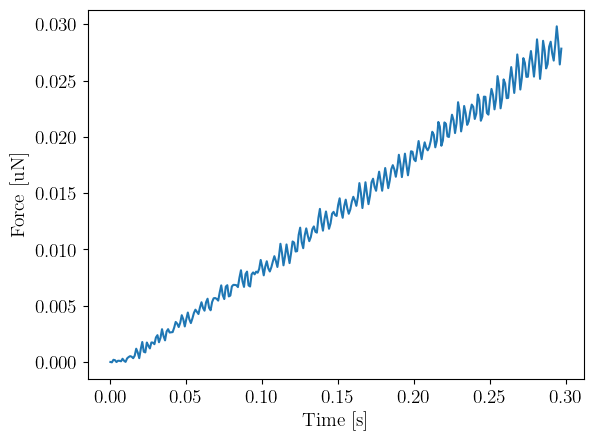

In [32]:
processing_pl = [crop_afm_temp, findContact_blackMagic]

afm.process_raw(processing_pl)
afm.plot_all(linestyle="-")

f_s = 1000 # sampling rate [Hz]

for i in range(0, 9):
    n = len(afm.data[i]["processed"]["force"])
    time = np.linspace(0, n-1, n) / f_s

    # fig = px.scatter(x=time, y=afm.data[i]["processed"]["force"])
    # fig.show()
    
    plt.figure()
    plt.plot(time, afm.data[i]["processed"]["force"])
    plt.xlabel("Time [s]")
    plt.ylabel("Force [uN]")
    plt.show()

#plt.show()

Mean and std: 32.077737894617634 0.8541285888364416


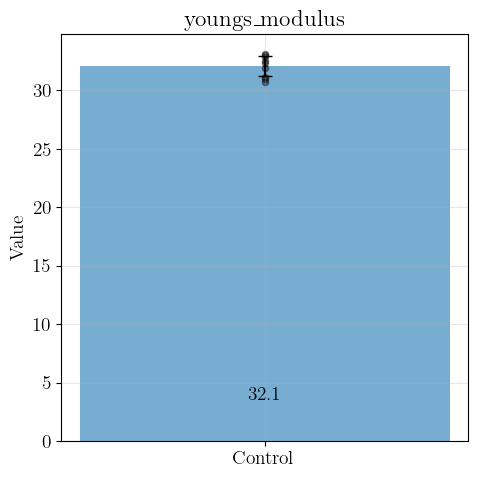

In [13]:
function_arguments = dict(radius=5, nu=0.5, cutoff=10, keyname="youngs_modulus")
afm.calculate_curve_parameter(function=parameter_youngs_modulus, **function_arguments)

plot_curve_parameters_bar(afm,
                         parameter_names=['youngs_modulus'],
                         labels=['Control'],
                         figsize=(5,5))

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 30
         Function evaluations: 60
35177.88499593735


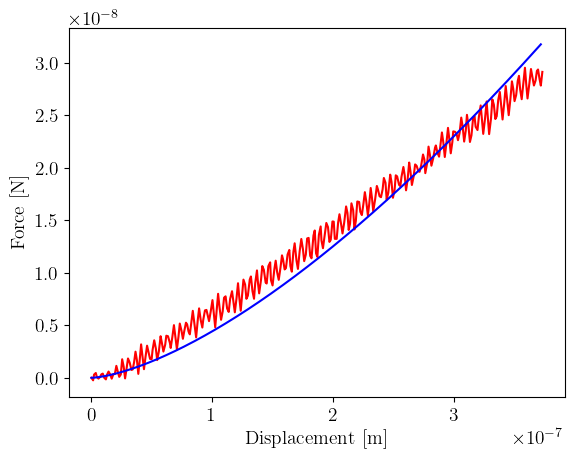

In [26]:
def hertzian(E, R, nu, z):
    hertz_F = 4.0 / 3.0 * E * np.sqrt(R) / (1 - nu*nu) * np.power(z, 3.0/2.0)
    
    return hertz_F

def sse(param, R, nu, F, z, cutoff):
    E = param
    ix = np.where(z > cutoff * R)[0]

    if(len(ix) == 0):
        ix = len(F) - 1
    else:
        ix = ix[0]

    force = F[:ix]
    disp_z = z[:ix]
    
    hertz_F = hertzian(E, R, nu, disp_z)

    sse_value = np.sum((force-hertz_F)**2.0)

    return sse_value

initial_guess = 50e3
R = 5 / 1e6
nu = 0.5
F = afm.data[0]["processed"]["force"] / 1e6
z = -afm.data[0]["processed"]["z"] / 1e6
cutoff = 0.10
result = fmin(sse, initial_guess, args=(R, nu, F, z, cutoff))
print(result[0])

ix = np.where(z > cutoff * R)[0]

if(len(ix) == 0):
    ix = len(F) - 1
else:
    ix = ix[0]
    
hertz_fit = hertzian(result[0], R, nu, z[:ix])

plt.figure()
plt.plot(z, F, 'r-')
plt.plot(z[:ix], hertz_fit, 'b-')
plt.xlabel("Displacement [m]")
plt.ylabel("Force [N]")
plt.show()

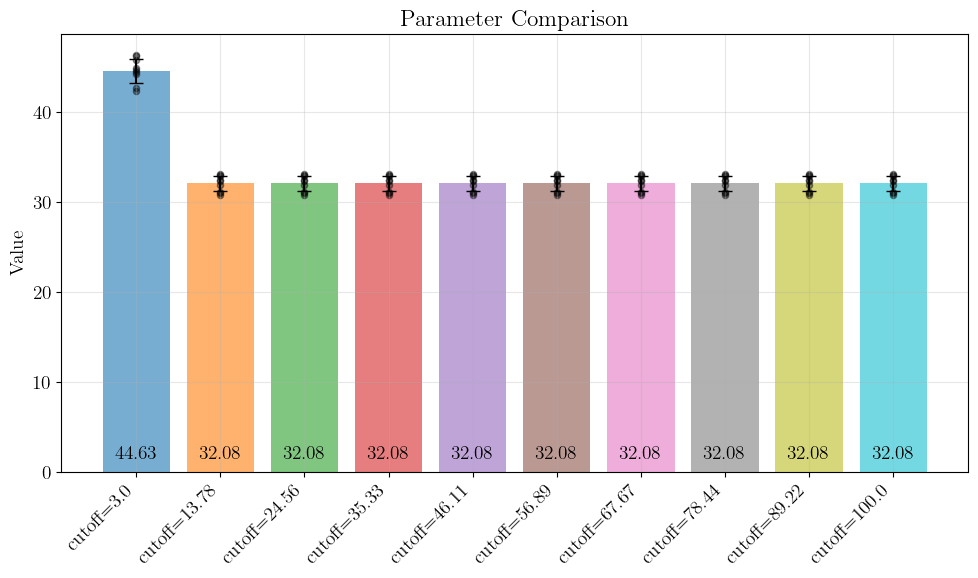

In [15]:
cutoffs = np.linspace(3, 100, 10)

for cutoff in cutoffs:
    function_arguments = dict(radius=5, nu=0.5, cutoff=cutoff, keyname="cutoff="+str(np.round(cutoff, 2)))
    afm.calculate_curve_parameter(function=parameter_youngs_modulus, **function_arguments)

plot_instance_parameters_bar(afm,
                         parameter_names=[*["cutoff="+str(np.round(cutoff, 2)) for cutoff in cutoffs]],
                         figsize=(10,6))